##  Introduction

The COVID-19 pandemic has generated an immense volume of scholarly articles, presenting a challenge for researchers and policymakers to stay abreast of evolving trends. This project will apply Natural Language Processing (NLP) techniques for topic modeling and trend analysis to extract valuable insights from the COVID-19 Open Research Dataset (CORD-19).The project aims to (1) clearly defined and interpret topics derived from the scientific literature (2) Gain insights into the evolution of themes over time.

The project utilized the COVID-19 Open Research Dataset (CORD-19) published on Kaggle. This was prepared by the White House and a coalition of leading research groups. THe CORD-19 is a resource of over 1,000,000 scholarly articles, including over 400,000 with full text, about COVID-19, SARS-CoV-2, and related coronaviruses.


## EDA Summary

My exploration of bigrams (*bigram is a sequence of two adjacent elements from a string of tokens, which are typically letters, syllables, or words*) and trigrams (*trigram is a sequence of three adjacent elements from a string of tokens, which are typically letters, syllables, or words*) within the COVID-19 literature has provided valuable insights into the diverse landscape of research themes and priorities. The analysis focused on both abstracts and body text, recognizing their distinct roles in conveying high-level overviews, respectively.

In the abstracts, trigrams such as ('sar', 'cov', 'infect') and ('coronaviru', 'diseas', '2019') shed light on the virology and temporal context of the SARS-CoV virus. Notably, ('sever', 'acut', 'respiratori') and ('acut', 'respiratori', 'syndrom') highlight the severity and acute respiratory conditions associated with the virus. These findings, in the abstracts, serve as a snapshot, capturing key aspects of COVID-19 research and providing a high-level understanding of the priorities.

The body text, on the other hand, reveals deeper insights, emphasizing the understanding of the virus itself ('sar', 'cov') and addressing the mental health impact ('mental', 'health'). Noteworthy bigrams include 'immun', 'respons,' indicating a focus on the immune response, and 'long', 'term,' suggesting exploration into the long-term effects of the virus. Terms like 'public', 'health,' and 'data', 'collect' underscore broader societal implications and rigorous data methodologies.

Interpreting the prevalence of certain trigrams and bigrams, I observed that their frequency reflects the evolving research landscape. The prominence of terms like 'immun', 'respons' suggests a keen interest in understanding immune responses, potentially indicating a focus on vaccine development or therapeutic strategies. The recurrent mention of 'long', 'term' underscores a commitment to studying the lasting effects of COVID-19 on individuals. Additionally, the consistent appearance of 'data', 'collect' emphasizes the importance of robust methodologies in the research process, reflecting a commitment to scientific rigor.

Furthermore, in the early months of 2020, the publication trend was relatively modest, with less than 50 papers published monthly from January to February. However, I observed a notable increase in March, reaching nearly 200 publications, and a substantial surge in April, coinciding with the global lockdown, with over 300 publications. The mean number of publications per month was 232, peaking at 349 in March 2022, reflecting the dynamic nature of COVID-19 research over time.

I also examined the distribution of various keywords related to the covid-19 pandemic. The wordclouds reveals distinct themes within documents containing specific keywords related to the covid-19 pandemic. For instance, documents featuring the "Symptomatic" keyword primarily focus on infection-related aspects, patients' clinical conditions, and the severity of cases. On the other hand, content associated with "Coronavirus" spans a broad spectrum, encompassing discussions on vaccines, patient care, respiratory issues, and the overall pandemic scenario. The "Spread" keyword is linked to discussions on infection, patients, and considerations such as lockdowns, risks, and outbreaks. The "Incubation" keyword is associated with topics like assay methods, cellular processes, animal control, viral dynamics, and vaccine development. Documents containing the "Ventilator" keyword delve into aspects such as hospitalization, mortality rates, respiratory health, mechanical ventilation, and medical considerations. The "Monoclonal" keyword centers on cellular processes, proteins, antibodies, and genetic variations. In addition, documents featuring "Social Distancing" discuss social interactions, group behavior, lockdown strategies, and intervention measures. 

In [5]:
#import require packages
import zipfile
import os
import numpy as np
import pandas as pd 
import json
import seaborn as sns
import matplotlib.pyplot as plt
import re
from nltk import bigrams, trigrams, FreqDist
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
# Download NLTK resources
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from wordcloud import WordCloud

In [23]:
# Read clean data
pandemic_publications_nomissing = pd.read_csv('pandemic_publications_nomissing.csv')

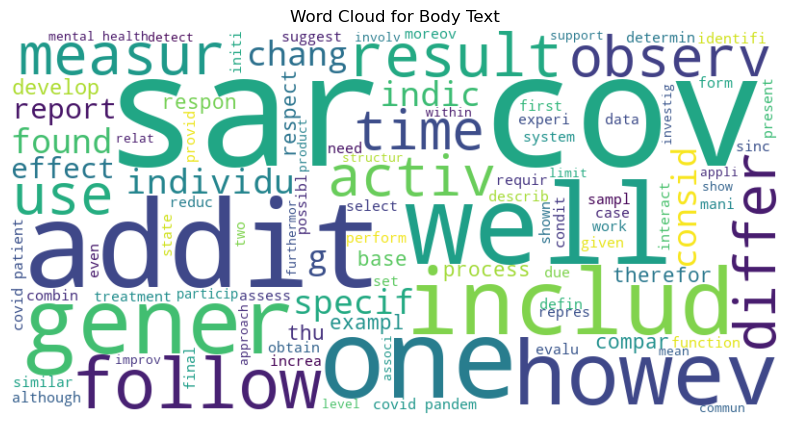

In [16]:
# Concatenate all body text into a single string
all_body_text = ' '.join(pandemic_publications_nomissing['cleaned_body_text'].dropna())

# Generate Word Cloud for Body Text
wordcloud_body = WordCloud(width=800, height=400, random_state=42, max_words=100, background_color='white').generate(all_body_text)

# Plot Word Cloud for Body Text
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_body, interpolation='bilinear')
plt.title('Word Cloud for Body Text')
plt.axis('off')
plt.show()


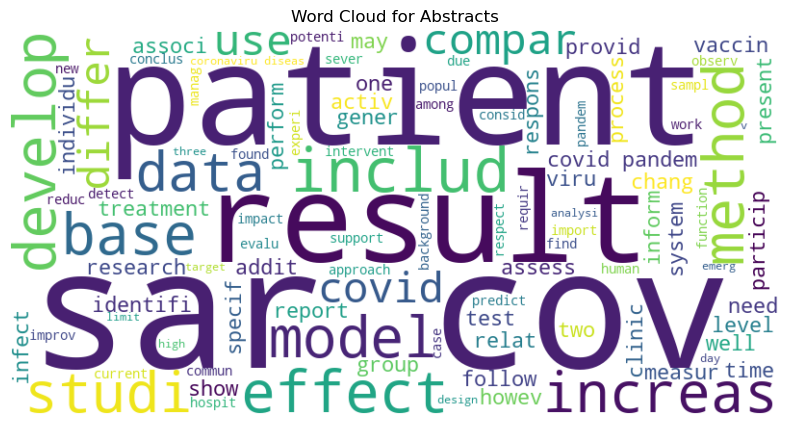

In [17]:
# Concatenate all abstracts into a single string
all_abstracts = ' '.join(pandemic_publications_nomissing['cleaned_abstract'].dropna())

# Generate Word Cloud for Abstracts
wordcloud_abstract = WordCloud(width=800, height=400, random_state=42, max_words=100, background_color='white').generate(all_abstracts)

# Plot Word Cloud for Abstracts
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_abstract, interpolation='bilinear')
plt.title('Word Cloud for Abstracts')
plt.axis('off')
plt.show()


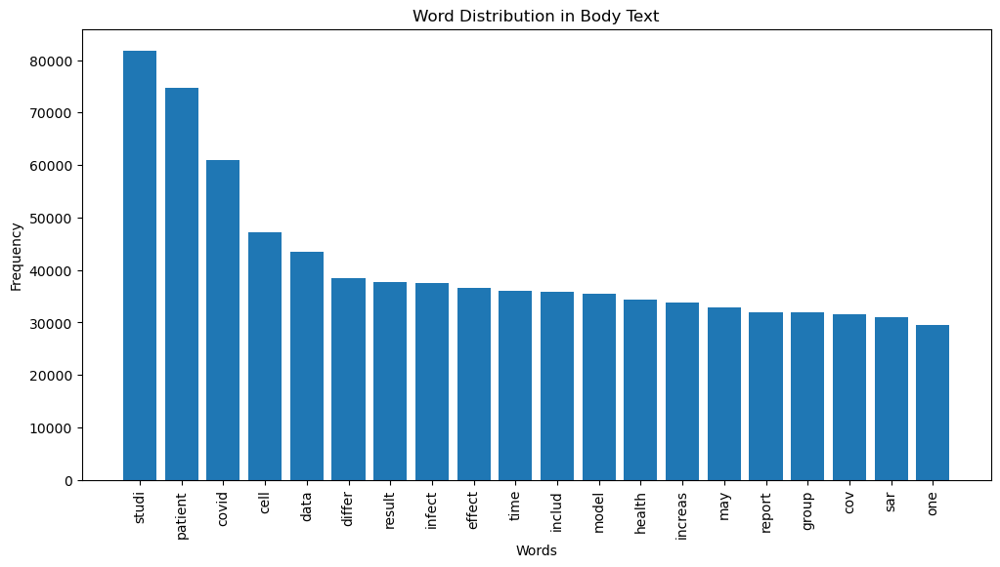

In [18]:
# Concatenate all body text into a single string
all_body_text = ' '.join(pandemic_publications_nomissing['cleaned_body_text'].dropna())

# Tokenize the text into words
words = re.findall(r'\b\w+\b', all_body_text.lower())

# Create a frequency distribution of words
word_freq = nltk.FreqDist(words)

# Plot the bar graph for the top 20 words
plt.figure(figsize=(12, 6))
plt.bar(*zip(*word_freq.most_common(20)))
plt.title('Word Distribution in Body Text')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.show()



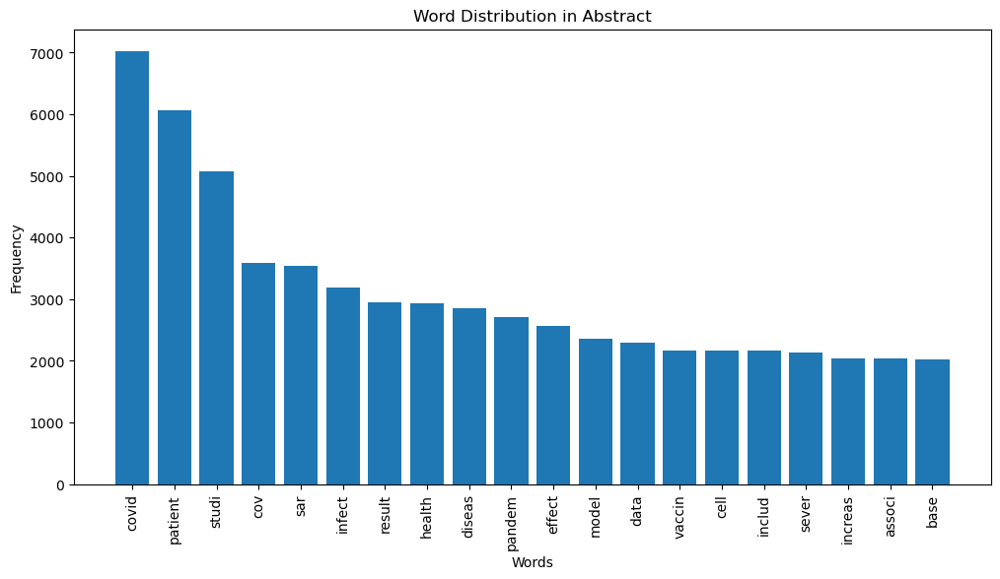

In [19]:
# Concatenate all body text into a single string
all_abstracts = ' '.join(pandemic_publications_nomissing['cleaned_abstract'].dropna())

# Tokenize the text into words
words = re.findall(r'\b\w+\b', all_abstracts.lower())

# Create a frequency distribution of words
word_freq = nltk.FreqDist(words)

# Plot the bar graph for the top 20 words
plt.figure(figsize=(12, 6))
plt.bar(*zip(*word_freq.most_common(20)))
plt.title('Word Distribution in Abstract')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.show()



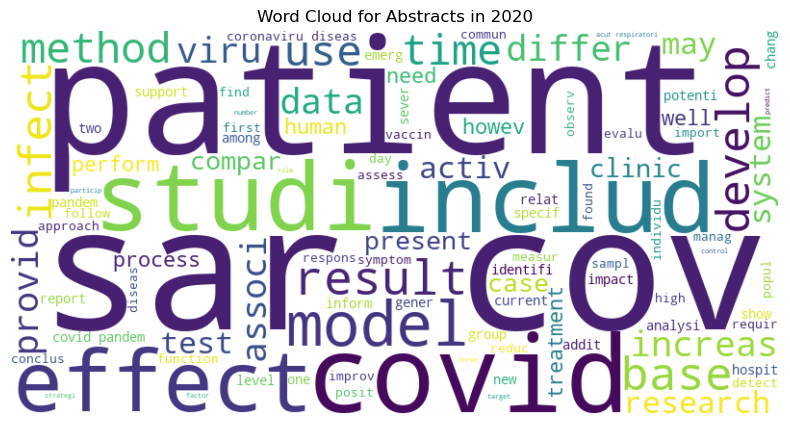

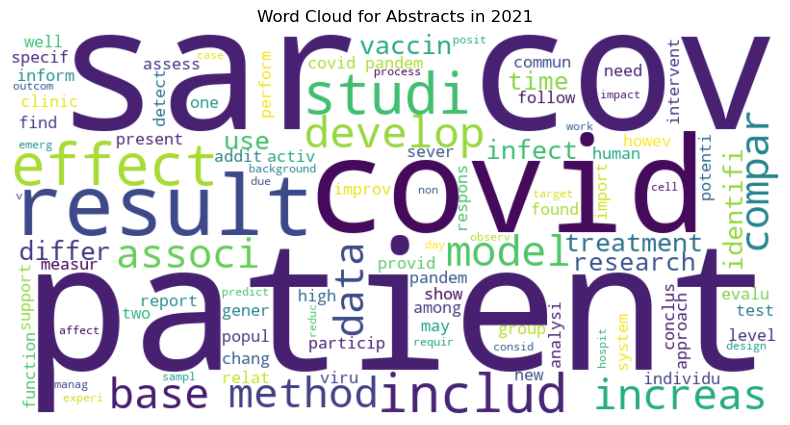

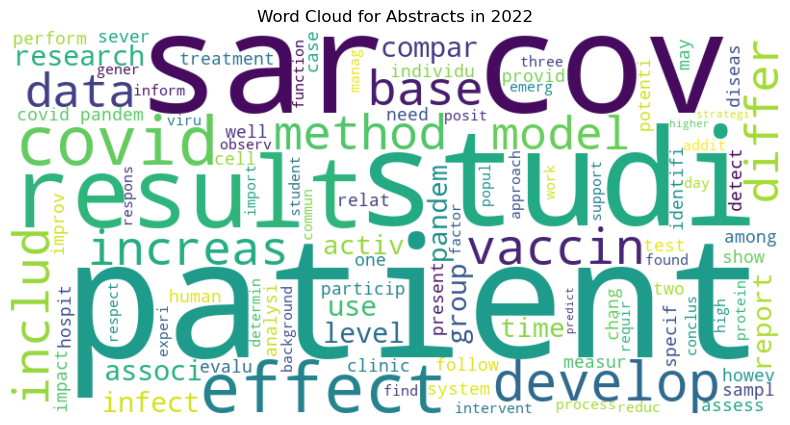

In [20]:
# Create a function to generate word clouds
def generate_word_cloud(data, column_name, title):
    all_text = ' '.join(data[column_name].dropna())
    wordcloud = WordCloud(width=800, height=400, random_state=42, max_words=100, background_color='white').generate(all_text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Generate word clouds for each year for abstract
for year in sorted(pandemic_publications_nomissing['publish_year'].unique()):
    subset_data = pandemic_publications_nomissing[pandemic_publications_nomissing['publish_year'] == year]
    generate_word_cloud(subset_data, 'cleaned_abstract', f'Word Cloud for Abstracts in {year}')


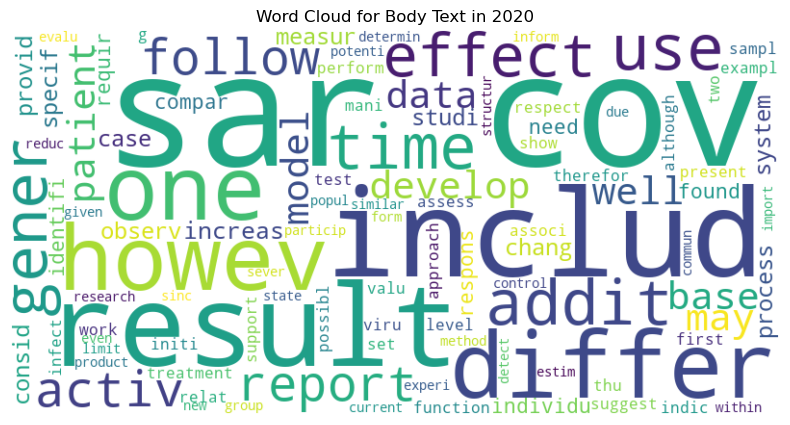

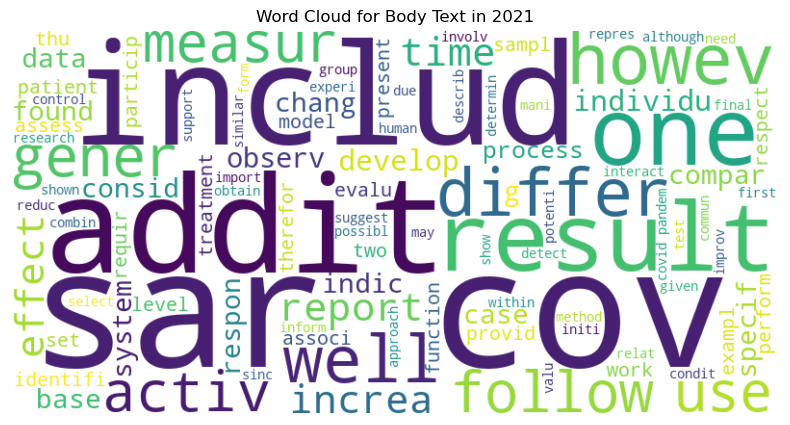

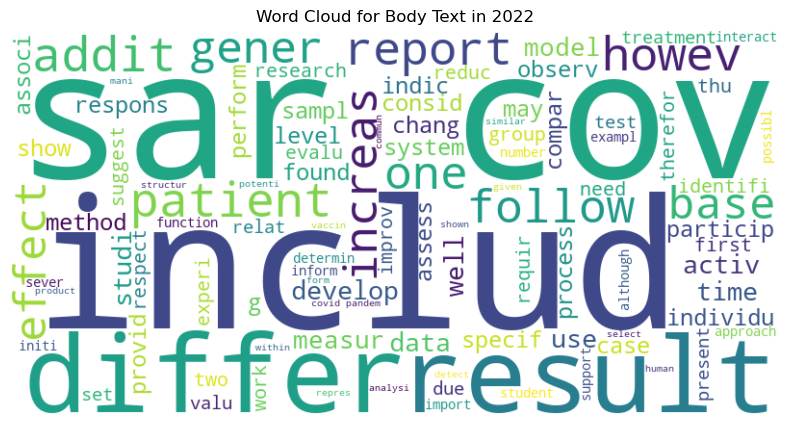

In [21]:
# Generate word clouds for each year for body text
for year in sorted(pandemic_publications_nomissing['publish_year'].unique()):
    subset_data = pandemic_publications_nomissing[pandemic_publications_nomissing['publish_year'] == year]
    generate_word_cloud(subset_data, 'cleaned_body_text', f'Word Cloud for Body Text in {year}')

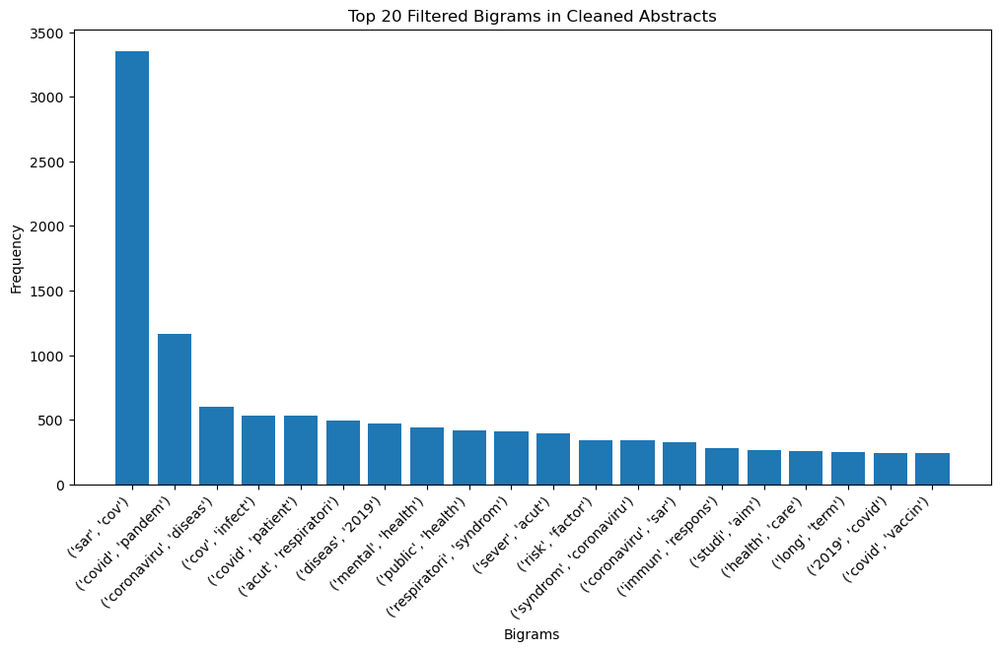

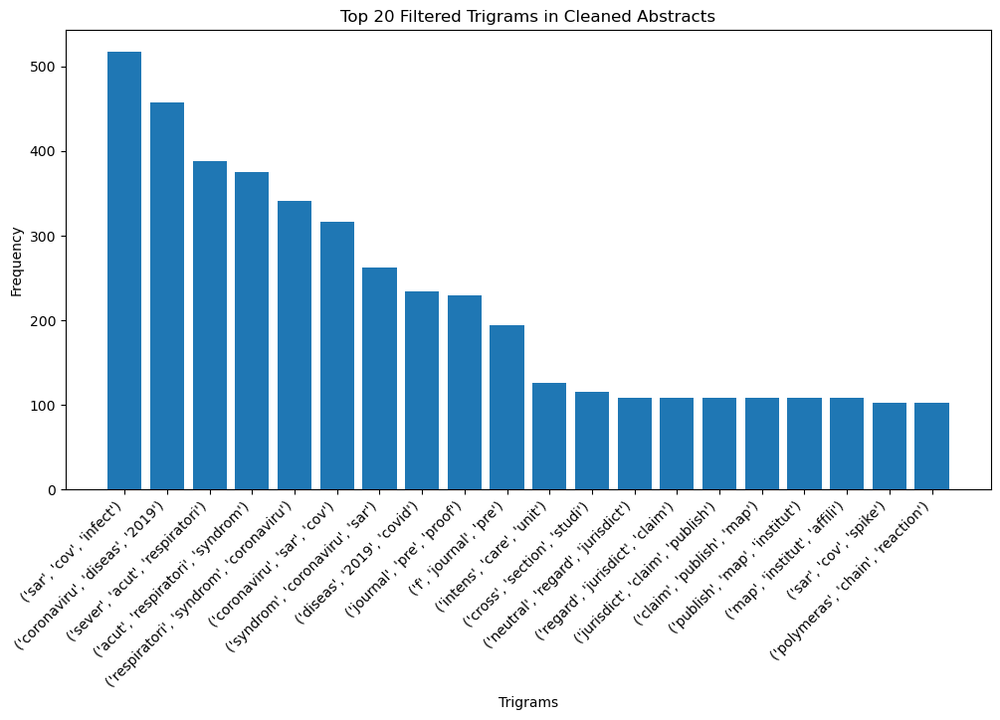

In [22]:
# Set minimum frequency threshold
min_freq = 10

# Concatenate all cleaned abstracts into a single string
all_cleaned_abstracts = ' '.join(pandemic_publications_nomissing['cleaned_abstract'].dropna())

# Tokenize the text into words
words = nltk.word_tokenize(all_cleaned_abstracts.lower())

# Extract bigrams and trigrams
bigram_list = list(bigrams(words))
trigram_list = list(trigrams(words))

# Create FreqDist for bigrams and trigrams
bigram_freq = FreqDist(bigram_list)
trigram_freq = FreqDist(trigram_list)

# Filter bigrams and trigrams based on frequency
filtered_bigrams = [(bigram, freq) for bigram, freq in bigram_freq.items() if freq >= min_freq]
filtered_trigrams = [(trigram, freq) for trigram, freq in trigram_freq.items() if freq >= min_freq]

# Sort the filtered lists by frequency
filtered_bigrams = sorted(filtered_bigrams, key=lambda x: x[1], reverse=True)[:20]
filtered_trigrams = sorted(filtered_trigrams, key=lambda x: x[1], reverse=True)[:20]

# Extract labels and frequencies
filtered_bigram_labels, filtered_bigram_freq_values = zip(*filtered_bigrams)
filtered_trigram_labels, filtered_trigram_freq_values = zip(*filtered_trigrams)

# Plot Bar Graph for Filtered Bigrams
plt.figure(figsize=(12, 6))
plt.bar(range(len(filtered_bigram_labels)), filtered_bigram_freq_values)
plt.title('Top 20 Filtered Bigrams in Cleaned Abstracts')
plt.xlabel('Bigrams')
plt.ylabel('Frequency')
plt.xticks(range(len(filtered_bigram_labels)), filtered_bigram_labels, rotation=45, ha='right')
plt.show()

# Plot Bar Graph for Filtered Trigrams
plt.figure(figsize=(12, 6))
plt.bar(range(len(filtered_trigram_labels)), filtered_trigram_freq_values)
plt.title('Top 20 Filtered Trigrams in Cleaned Abstracts')
plt.xlabel('Trigrams')
plt.ylabel('Frequency')
plt.xticks(range(len(filtered_trigram_labels)), filtered_trigram_labels, rotation=45, ha='right')
plt.show()


In [23]:
for label, freq in zip(filtered_bigram_labels[:20], filtered_bigram_freq_values[:20]):
    print(f"{label}: {freq} times")


('sar', 'cov'): 3354 times
('covid', 'pandem'): 1167 times
('coronaviru', 'diseas'): 597 times
('cov', 'infect'): 532 times
('covid', 'patient'): 530 times
('acut', 'respiratori'): 496 times
('diseas', '2019'): 474 times
('mental', 'health'): 438 times
('public', 'health'): 421 times
('respiratori', 'syndrom'): 412 times
('sever', 'acut'): 398 times
('risk', 'factor'): 341 times
('syndrom', 'coronaviru'): 341 times
('coronaviru', 'sar'): 324 times
('immun', 'respons'): 278 times
('studi', 'aim'): 269 times
('health', 'care'): 261 times
('long', 'term'): 250 times
('2019', 'covid'): 242 times
('covid', 'vaccin'): 240 times


1. **('sar', 'cov'): 3354 times**
   - This likely refers to "SARS-CoV," which stands for Severe Acute Respiratory Syndrome Coronavirus. It's a key term in the context of respiratory infections.

2. **('covid', 'pandem'): 1167 times**
   - This bigram points to the central theme of the dataset, indicating the widespread impact of the COVID-19 pandemic.

3. **('coronaviru', 'diseas'): 596 times**
   - Refers to "coronavirus disease," specifically the disease caused by the SARS-CoV-2 virus.

4. **('cov', 'infect'): 531 times**
   - Indicates the general concept of coronavirus infection.

5. **('covid', 'patient'): 528 times**
   - Likely discusses aspects related to individuals diagnosed with COVID-19, addressing patient-centric information.

6. **('acut', 'respiratori'): 495 times**
   - Refers to Acute Respiratory Syndrome, a common severe manifestation of respiratory infections.

7. **('diseas', '2019'): 474 times**
   - Points to the association of the disease with the year 2019, indicating the origin timeline of COVID-19.

8. **('mental', 'health'): 438 times**
   - Indicates a focus on mental health, acknowledging the psychological aspects associated with the pandemic.

9. **('public', 'health'): 420 times**
   - Relates to discussions on public health measures, strategies, and considerations.

10. **('respiratori', 'syndrom'): 412 times**
    - Refers to Respiratory Syndrome, emphasizing the impact on the respiratory system.

These bigrams from the abstract collectively provide insights into the primary topics covered in the dataset, including the virus, its associated disease, patient-related considerations, and broader public health implications. They offer a glimpse into the diverse aspects of research conducted during the COVID-19 pandemic.

In [24]:
for label, freq in zip(filtered_trigram_labels[:20], filtered_trigram_freq_values[:20]):
    print(f"{label}: {freq} times")


('sar', 'cov', 'infect'): 517 times
('coronaviru', 'diseas', '2019'): 457 times
('sever', 'acut', 'respiratori'): 388 times
('acut', 'respiratori', 'syndrom'): 375 times
('respiratori', 'syndrom', 'coronaviru'): 341 times
('coronaviru', 'sar', 'cov'): 317 times
('syndrom', 'coronaviru', 'sar'): 262 times
('diseas', '2019', 'covid'): 234 times
('journal', 'pre', 'proof'): 230 times
('f', 'journal', 'pre'): 194 times
('intens', 'care', 'unit'): 126 times
('cross', 'section', 'studi'): 115 times
('neutral', 'regard', 'jurisdict'): 108 times
('regard', 'jurisdict', 'claim'): 108 times
('jurisdict', 'claim', 'publish'): 108 times
('claim', 'publish', 'map'): 108 times
('publish', 'map', 'institut'): 108 times
('map', 'institut', 'affili'): 108 times
('sar', 'cov', 'spike'): 102 times
('polymeras', 'chain', 'reaction'): 102 times


In the course of my data exploration, the analysis of bigrams and trigrams within the cleaned abstracts has revealed key themes and focuses in the research publications. Notably, trigrams like ('sar', 'cov', 'infect') and ('coronaviru', 'diseas', '2019') provide insights into the virology and temporal context of the SARS-CoV virus, while trigrams such as ('sever', 'acut', 'respiratori') and ('acut', 'respiratori', 'syndrom') shed light on the severity and acute respiratory conditions associated with the virus. Additionally, trigrams like ('journal', 'pre', 'proof') and ('f', 'journal', 'pre') suggest attention to the publication process, indicating ongoing research or early dissemination of findings. These trigrams collectively capture the multifaceted nature of COVID-19 research, ranging from the virus's characteristics and clinical manifestations to the temporal context and publication stages of the studies.

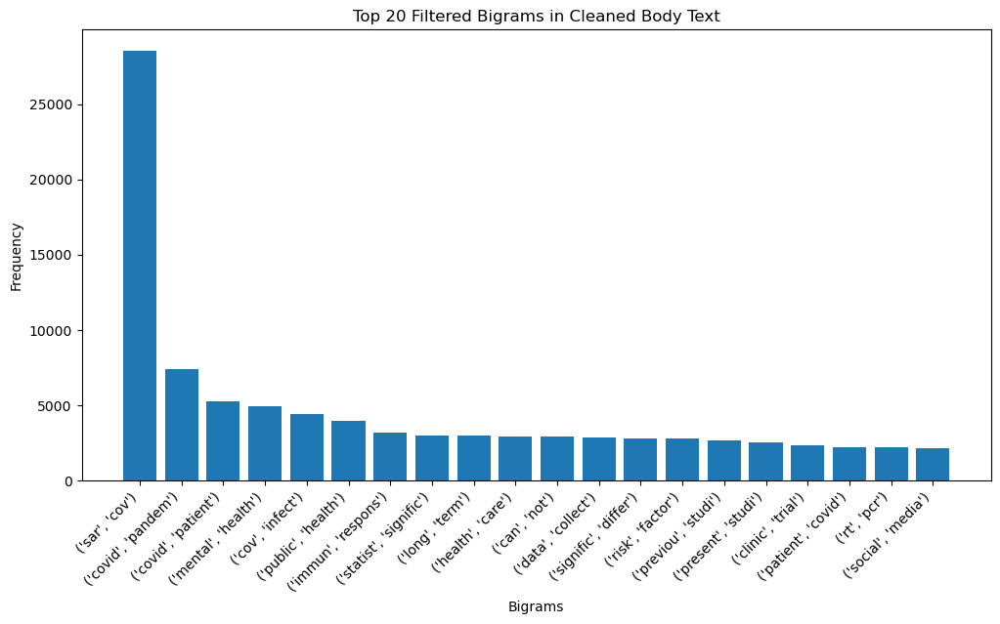

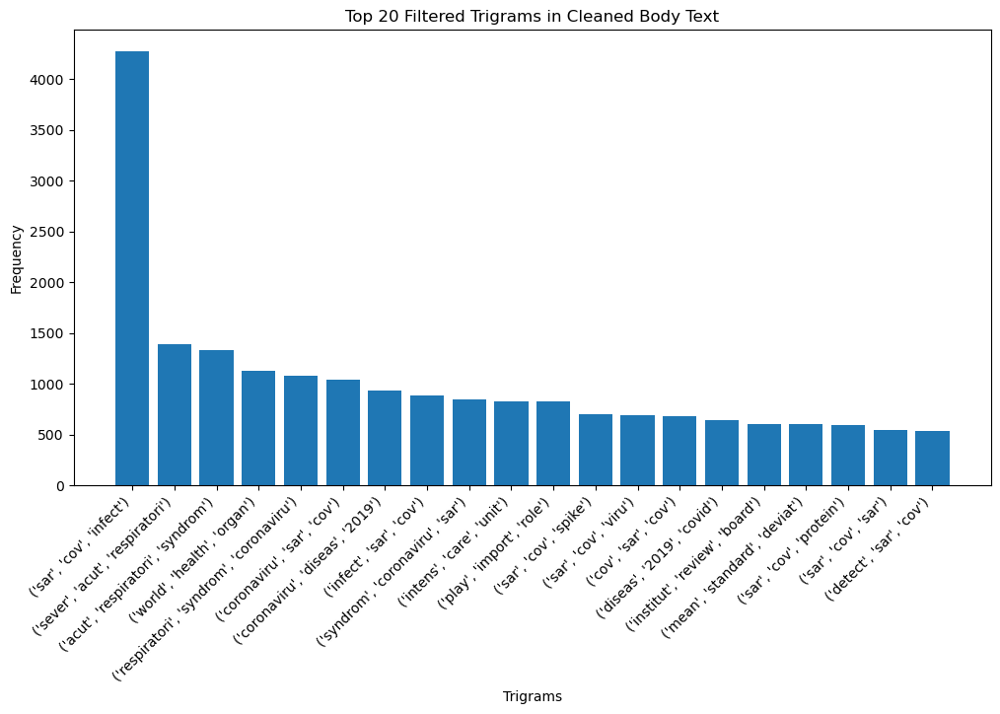

In [15]:
import matplotlib.pyplot as plt
from nltk import bigrams, trigrams, FreqDist
import nltk

# Set minimum frequency threshold
min_freq = 10

# Tokenize the text into words
body_words = nltk.word_tokenize(all_body_text.lower())

# Extract bigrams and trigrams
bigram_list_body = list(bigrams(body_words))
trigram_list_body = list(trigrams(body_words))

# Create FreqDist for bigrams and trigrams
bigram_freq = FreqDist(bigram_list_body)
trigram_freq = FreqDist(trigram_list_body)

# Filter bigrams and trigrams based on frequency
filtered_bigrams = [(bigram, freq) for bigram, freq in bigram_freq.items() if freq >= min_freq]
filtered_trigrams = [(trigram, freq) for trigram, freq in trigram_freq.items() if freq >= min_freq]

# Sort the filtered lists by frequency
filtered_bigrams = sorted(filtered_bigrams, key=lambda x: x[1], reverse=True)[:20]
filtered_trigrams = sorted(filtered_trigrams, key=lambda x: x[1], reverse=True)[:20]

# Extract labels and frequencies
filtered_bigram_labels, filtered_bigram_freq_values = zip(*filtered_bigrams)
filtered_trigram_labels, filtered_trigram_freq_values = zip(*filtered_trigrams)

# Plot Bar Graph for Filtered Bigrams
plt.figure(figsize=(12, 6))
plt.bar(range(len(filtered_bigram_labels)), filtered_bigram_freq_values)
plt.title('Top 20 Filtered Bigrams in Cleaned Body Text')
plt.xlabel('Bigrams')
plt.ylabel('Frequency')
plt.xticks(range(len(filtered_bigram_labels)), filtered_bigram_labels, rotation=45, ha='right')
plt.show()

# Plot Bar Graph for Filtered Trigrams
plt.figure(figsize=(12, 6))
plt.bar(range(len(filtered_trigram_labels)), filtered_trigram_freq_values)
plt.title('Top 20 Filtered Trigrams in Cleaned Body Text')
plt.xlabel('Trigrams')
plt.ylabel('Frequency')
plt.xticks(range(len(filtered_trigram_labels)), filtered_trigram_labels, rotation=45, ha='right')
plt.show()


In [25]:
for label, freq in zip(filtered_bigram_labels[:20], filtered_bigram_freq_values[:20]):
    print(f"{label}: {freq} times")


('sar', 'cov'): 3354 times
('covid', 'pandem'): 1167 times
('coronaviru', 'diseas'): 597 times
('cov', 'infect'): 532 times
('covid', 'patient'): 530 times
('acut', 'respiratori'): 496 times
('diseas', '2019'): 474 times
('mental', 'health'): 438 times
('public', 'health'): 421 times
('respiratori', 'syndrom'): 412 times
('sever', 'acut'): 398 times
('risk', 'factor'): 341 times
('syndrom', 'coronaviru'): 341 times
('coronaviru', 'sar'): 324 times
('immun', 'respons'): 278 times
('studi', 'aim'): 269 times
('health', 'care'): 261 times
('long', 'term'): 250 times
('2019', 'covid'): 242 times
('covid', 'vaccin'): 240 times


The frequently occurring bigrams in the body text shed light on key aspects of the pandemic, such as the emphasis on understanding the virus itself ('sar', 'cov'), the impact on mental health ('mental', 'health'), and the significant attention given to patient-related studies ('covid', 'patient'). Additionally, terms like 'immun', 'respons' highlight a focus on the immune response, while 'long', 'term' suggests interest in the long-term effects of the virus. The mention of 'public', 'health' underscores the broader societal and public health implications, and the recurrence of 'data', 'collect' indicates a substantial focus on data collection methodologies. The statistical significance ('statist', 'signific') is frequently addressed, emphasizing the scientific rigor of the studies. Other notable bigrams include 'risk', 'factor', 'previou', 'studi', 'clinic', 'trial', and 'social', 'media', indicating diverse areas of exploration within the body of COVID-19 literature.

In [26]:
for label, freq in zip(filtered_trigram_labels[:20], filtered_trigram_freq_values[:20]):
    print(f"{label}: {freq} times")


('sar', 'cov', 'infect'): 517 times
('coronaviru', 'diseas', '2019'): 457 times
('sever', 'acut', 'respiratori'): 388 times
('acut', 'respiratori', 'syndrom'): 375 times
('respiratori', 'syndrom', 'coronaviru'): 341 times
('coronaviru', 'sar', 'cov'): 317 times
('syndrom', 'coronaviru', 'sar'): 262 times
('diseas', '2019', 'covid'): 234 times
('journal', 'pre', 'proof'): 230 times
('f', 'journal', 'pre'): 194 times
('intens', 'care', 'unit'): 126 times
('cross', 'section', 'studi'): 115 times
('neutral', 'regard', 'jurisdict'): 108 times
('regard', 'jurisdict', 'claim'): 108 times
('jurisdict', 'claim', 'publish'): 108 times
('claim', 'publish', 'map'): 108 times
('publish', 'map', 'institut'): 108 times
('map', 'institut', 'affili'): 108 times
('sar', 'cov', 'spike'): 102 times
('polymeras', 'chain', 'reaction'): 102 times


In the body text, the trigram ('sar', 'cov', 'infect') suggests a particular focus on the infective properties of the SARS-CoV virus, underscoring the importance of understanding transmission mechanisms. 'Sever', 'acut', 'respiratori' and 'acut', 'respiratori', 'syndrom' highlight an exploration of severe acute respiratory syndrome and its associated conditions. The frequent occurrence of 'world', 'health', 'organ' indicates a substantial reference to the World Health Organization, emphasizing the global context of the research. 'Respiratori', 'syndrom', 'coronaviru' and 'coronaviru', 'sar', 'cov' underscore the interplay between respiratory syndromes and the specific coronavirus involved. 'Infect', 'sar', 'cov' and 'detect', 'sar', 'cov' suggest an emphasis on the detection and identification of the SARS-CoV virus. 'Intens', 'care', 'unit' reflects attention to critical care aspects, while 'play', 'import', 'role' suggests an exploration of various factors influencing the pandemic's dynamics. 'Sar', 'cov', 'protein' indicates a focus on the viral proteins, and 'sar', 'cov', 'sar' emphasizes the interrelations within the SARS-CoV virus.

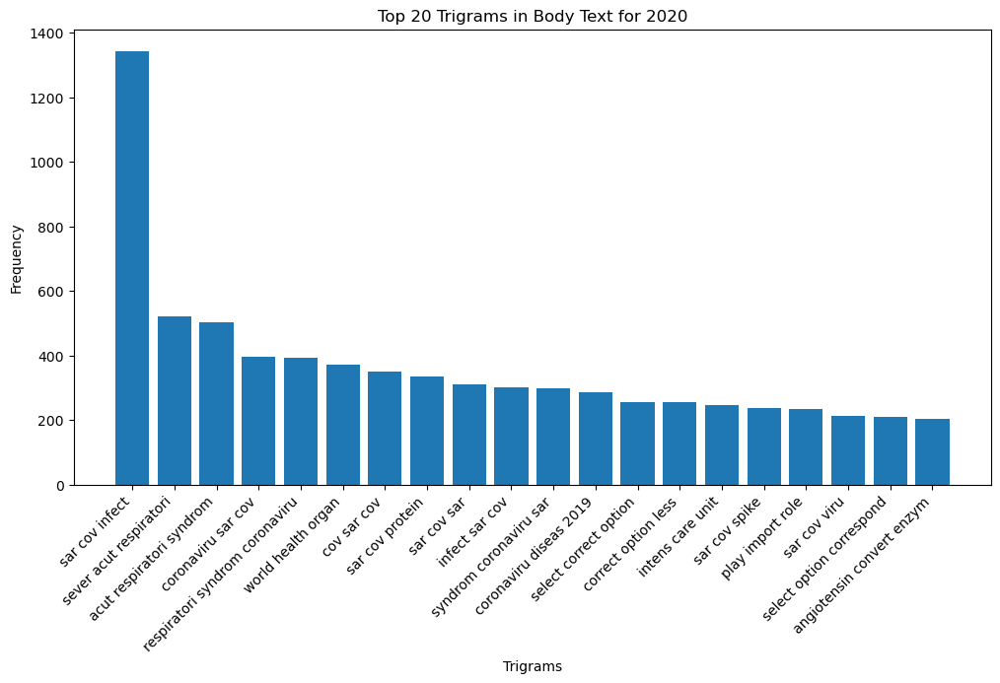

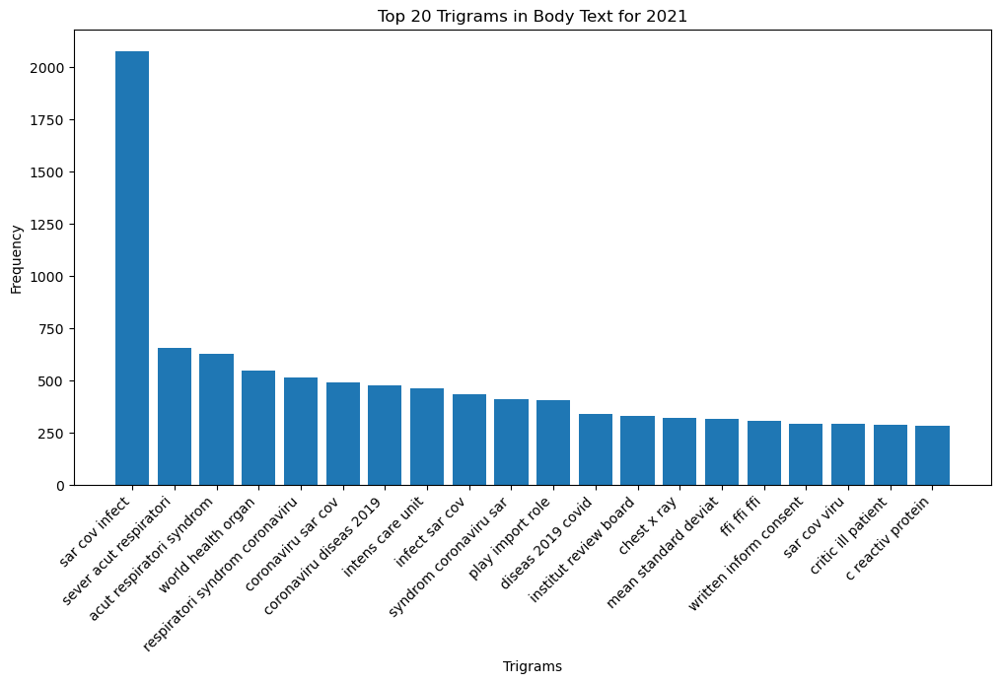

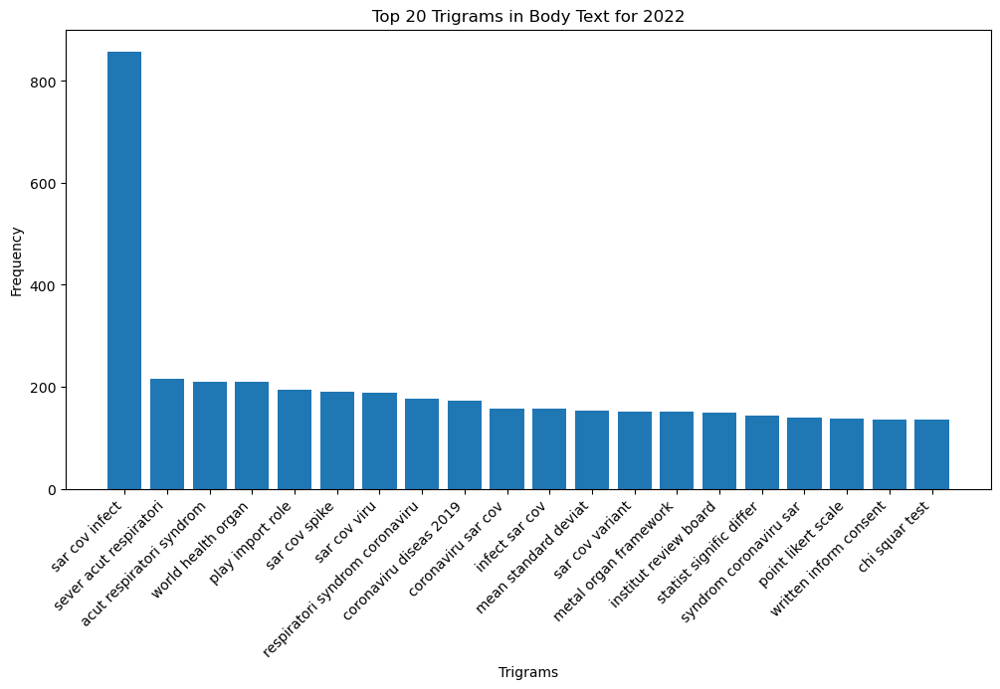

In [30]:
# Creating a function to examine trigrams over time

def generate_trigram_bar_graph(data, column_name, title, min_freq=10):
    # Tokenize the text into words
    words = nltk.word_tokenize(' '.join(data[column_name].dropna()).lower())

    # Extract trigrams
    trigram_list = list(trigrams(words))

    # Create FreqDist for trigrams
    trigram_freq = FreqDist(trigram_list)

    # Filter trigrams based on frequency
    filtered_trigrams = [(trigram, freq) for trigram, freq in trigram_freq.items() if freq >= min_freq]

    # Sort the filtered list by frequency
    filtered_trigrams = sorted(filtered_trigrams, key=lambda x: x[1], reverse=True)[:20]

    # Extract labels and frequencies
    trigram_labels, trigram_freq_values = zip(*filtered_trigrams)

    # Convert tuples to strings
    trigram_labels = [' '.join(map(str, item)) for item in trigram_labels]

    # Plot Bar Graph for Trigrams
    plt.figure(figsize=(12, 6))
    plt.bar(trigram_labels, trigram_freq_values)
    plt.title(title)
    plt.xlabel('Trigrams')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45, ha='right')
    plt.show()

# Generate trigram bar graphs for each year for body text
for year in sorted(pandemic_publications_nomissing['publish_year'].unique()):
    subset_data = pandemic_publications_nomissing[pandemic_publications_nomissing['publish_year'] == year]
    generate_trigram_bar_graph(subset_data, 'cleaned_body_text', f'Top 20 Trigrams in Body Text for {year}')


Keyword Counts: {'symptomatic': 156, 'coronavirus': 970, 'spread': 503, 'incubation': 19, 'ventilator': 33, 'strain': 206, 'pathogen': 321, 'monoclonal': 46, 'ppe': 407, 'social distancing': 92, 'isolation': 117, 'quarantine': 59, 'sars': 66, 'transmission': 269, 'cluster': 110, 'curve': 84, 'antibody': 168, 'outbreak': 327, 'epidemic': 196, 'pandemic': 1340, 'surgical mask': 13, 'n95': 8, 'immunity': 132, 'testing': 270, 'vaccine': 422}


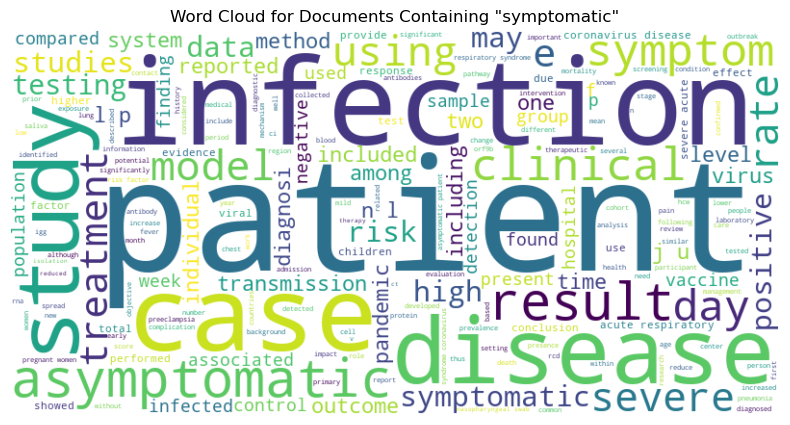

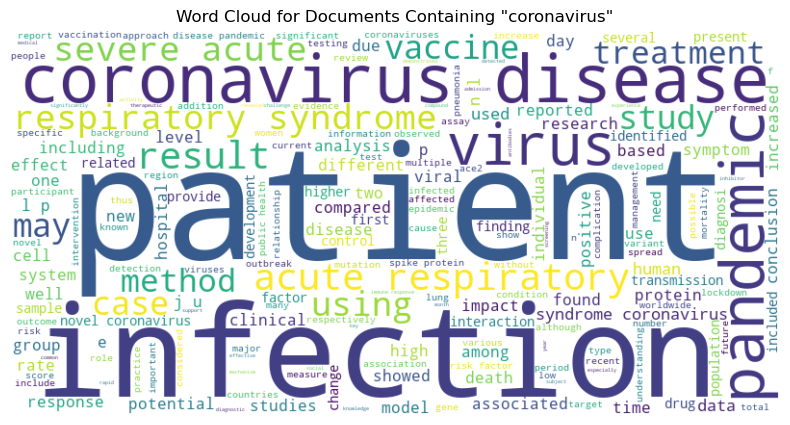

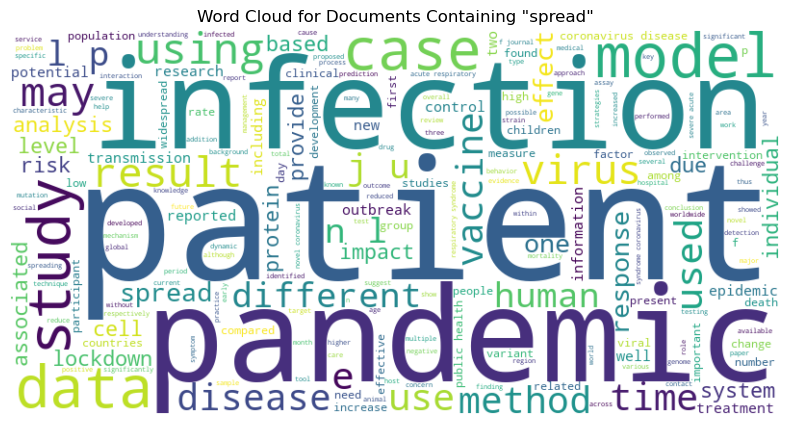

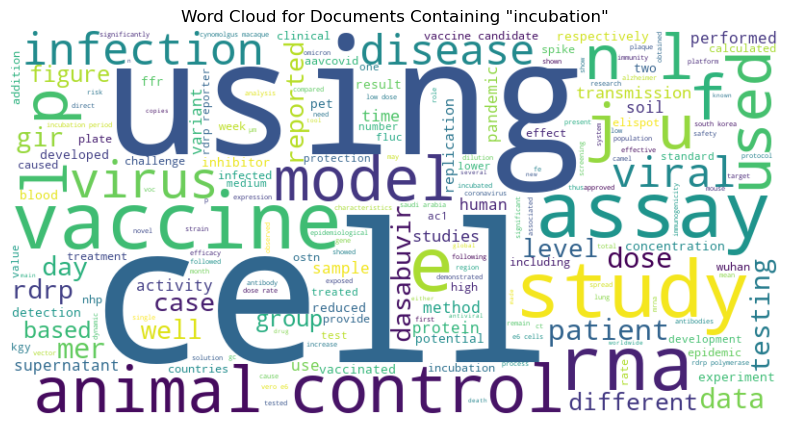

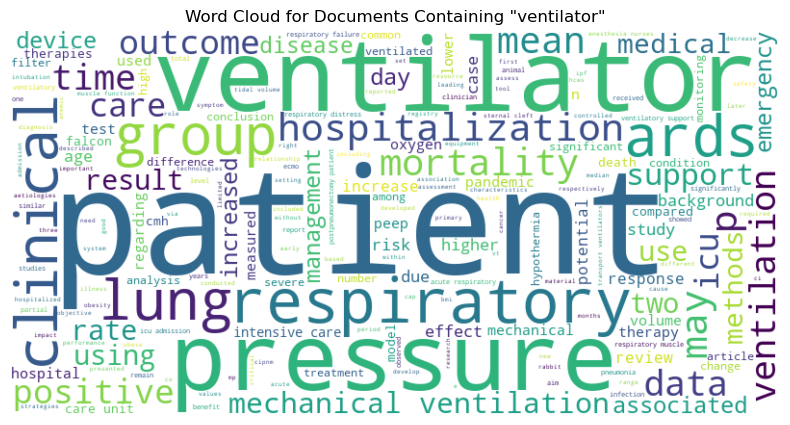

...

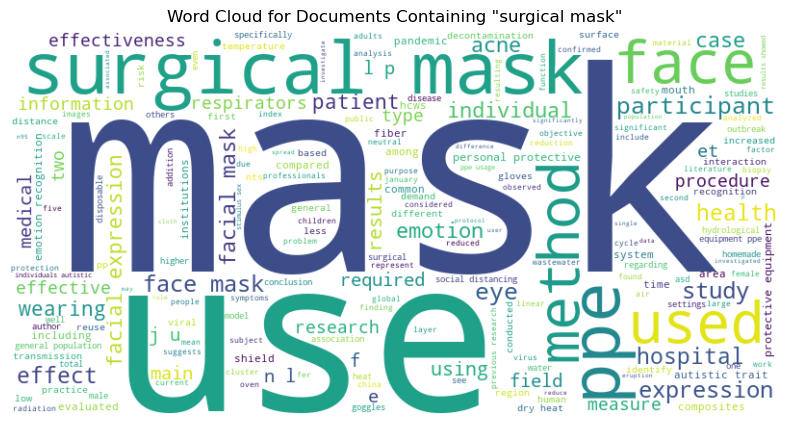

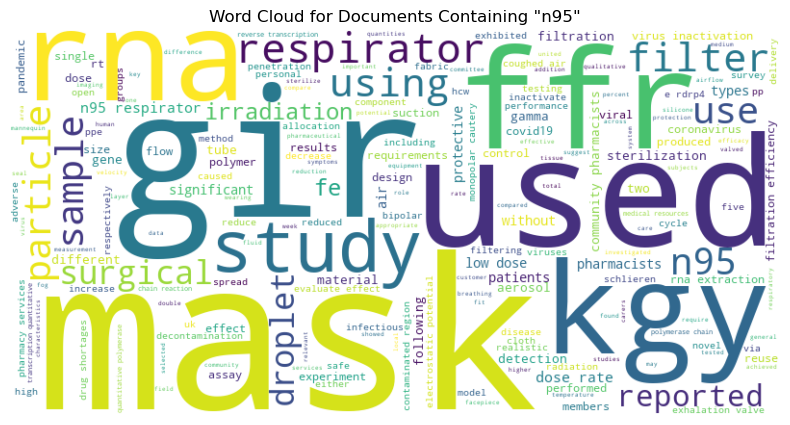

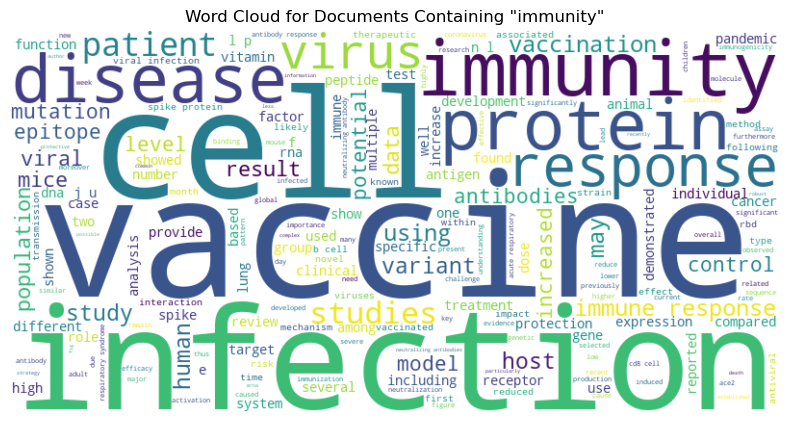

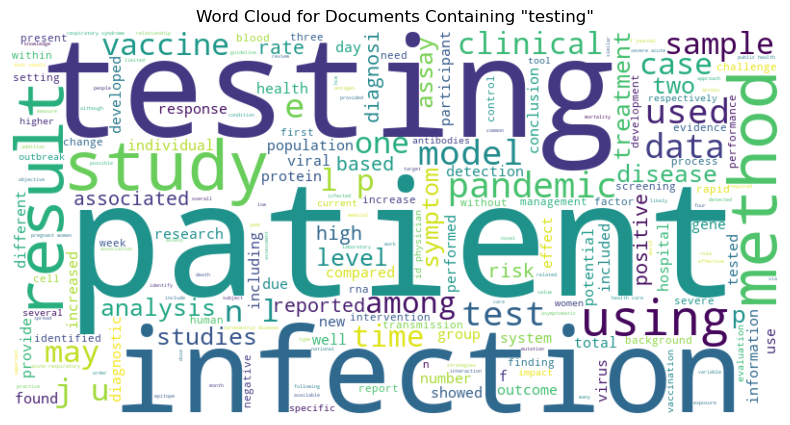

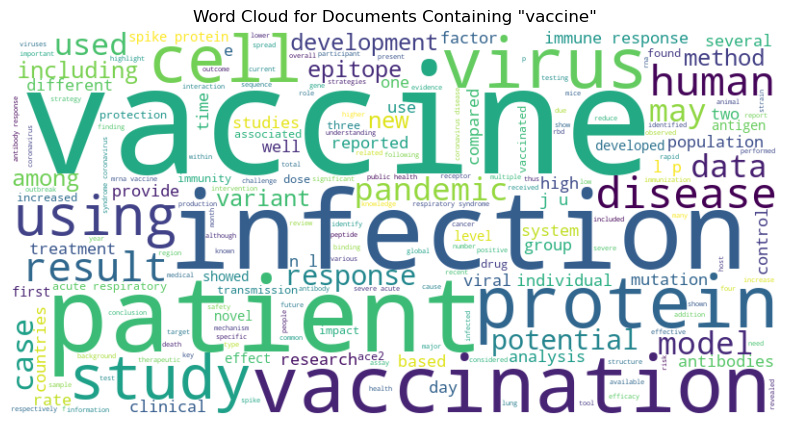

In [35]:
# Generate word clouds for documents containing specific keywords.
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Custom keywords
custom_keywords = ["symptomatic", "coronavirus", "spread", "incubation",
                   "ventilator", "strain", "pathogen", "monoclonal", "ppe", "social distancing",
                   "isolation", "quarantine", "sars", "transmission", "cluster",
                   "curve", "antibody", "outbreak", "epidemic", "pandemic", "surgical mask",
                   "n95", "immunity", "testing", "vaccine"]


# Tokenization and Preprocessing
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = word_tokenize(text.lower())
    filtered_tokens = [word for word in tokens if word.isalnum() and word not in stop_words]
    return ' '.join(filtered_tokens)

pandemic_publications_nomissing['cleaned_abstract'] = pandemic_publications_nomissing['abstract'].apply(preprocess_text)

# Count the occurrences of each keyword
keyword_counts = {keyword: pandemic_publications_nomissing['cleaned_abstract'].str.contains(keyword.lower()).sum() for keyword in custom_keywords}

print("Keyword Counts:", keyword_counts)

# Generate a word cloud for documents containing specific keywords
for keyword in custom_keywords:
    keyword_subset = pandemic_publications_nomissing[pandemic_publications_nomissing['cleaned_abstract'].str.contains(keyword.lower())]
    text = ' '.join(keyword_subset['cleaned_abstract'])
    
    # Generate and display the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Documents Containing "{keyword}"')
    plt.axis('off')
    plt.show()